<a href="https://colab.research.google.com/github/arizonaCameraLab/computationalImaging/blob/master/Chapter9DigitalImaging/slantedEdgeMTFAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Slanted Edge MTF Measurement

## David Brady
## University of Arizona
## Spring 2023

This notebook uses slanted edge images to analyze the MTF for a Samsung note20 Ultra smart phone. The listed camera specifications are as follows

108 MP, f/1.8, 26mm (wide), 1/1.33", 0.8µm, PDAF, Laser AF, OIS

12 MP, f/3.0, 120mm (periscope telephoto), 1.0µm, PDAF, OIS, 5x optical zoom, 50x hybrid zoom

12 MP, f/2.2, 120˚, 13mm (ultrawide), 1/2.55", 1.4µm

These specifications are in marketing speak, the focal lengths listed are 35 mm equivalent. The actual focal lengths are 2.2 mm for the ultrawide, 7 mm for the wide and 14.2 mm for the telephoto.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
from scipy.special import erf
from google.colab import files
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})


In [2]:
!pip install rawpy
import rawpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 20.1 MB/s eta 0:00:00


## telephoto lens

We consider below  a photo taken with the telephoto lens.

samsung SM-N986U1
ƒ/3
1/30
14.2mm
ISO32

In [3]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/14p2mm.dng'

--2025-03-23 18:56:52--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/14p2mm.dng
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/14p2mm.dng [following]
--2025-03-23 18:56:53--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/14p2mm.dng
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24141312 (23M) [application/octet-stream]
Saving to: ‘14p2mm.dng’

14p2mm.dng          100%[===================>]  23.02M  87.0MB/s    in 0.3s    

2025-

In [4]:
raw = rawpy.imread('14p2mm.dng')
rawImage=raw.raw_image_visible

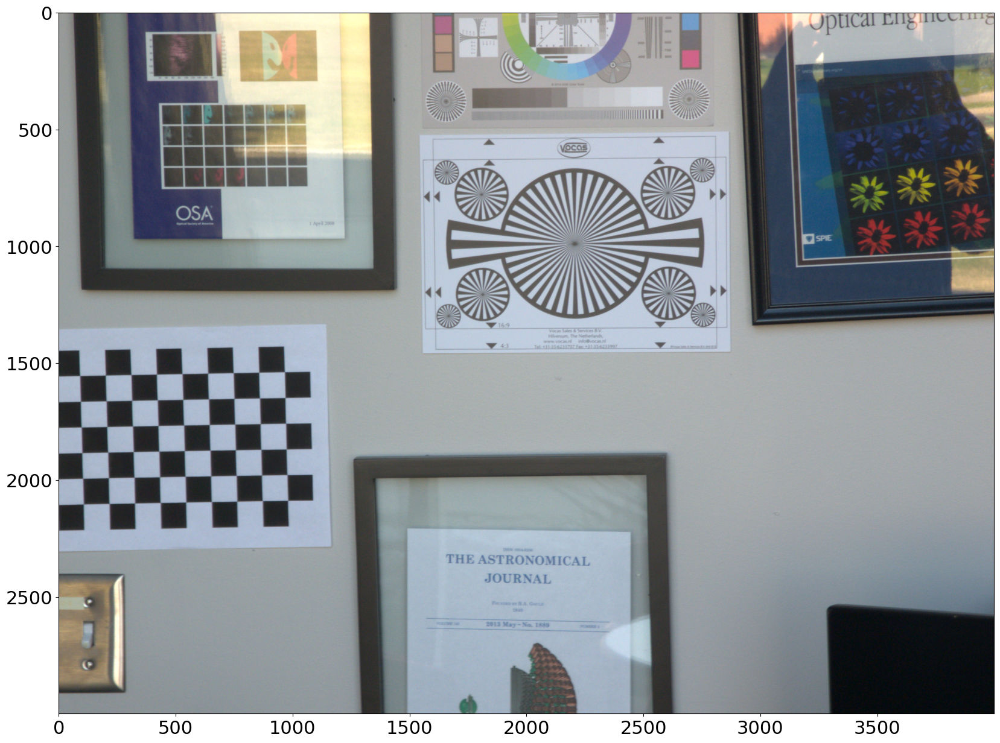

In [5]:
plt.imshow(raw.postprocess())

In [ ]:
rawImage.shape

(3000, 4000)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

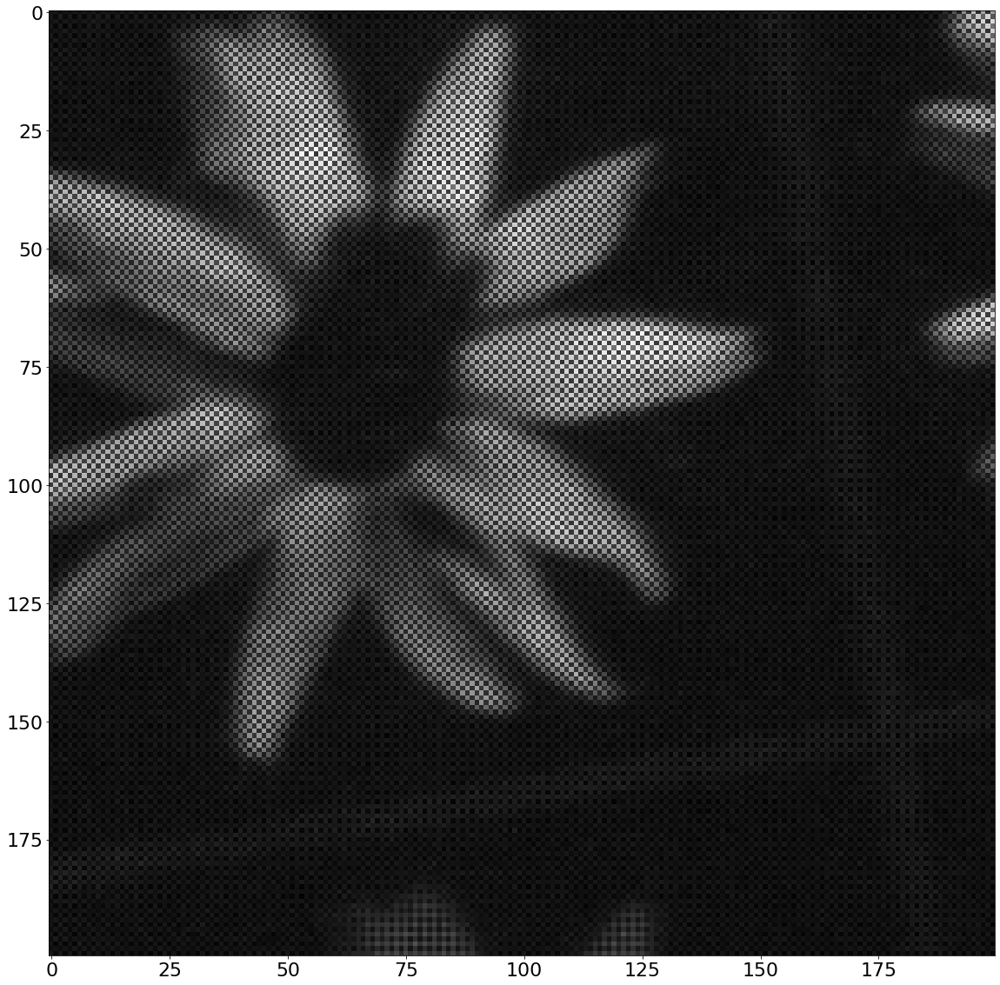

In [ ]:
plt.imshow(rawImage[700:900,3400:3600],cmap='gray')
plt.axis('image')
plt.savefig('samsungTele.pdf')
files.download('samsungTele.pdf')

we break the image into its RGB components with the following code. The green images should look the same, look for red and blue features in the original image to identify the corresponding channels.

In [6]:
b=rawImage[0:3000:2,0:4000:2]
r=rawImage[1:3000:2,1:4000:2]
g1=rawImage[1:3000:2,0:4000:2]
g2=rawImage[0:3000:2,1:4000:2]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

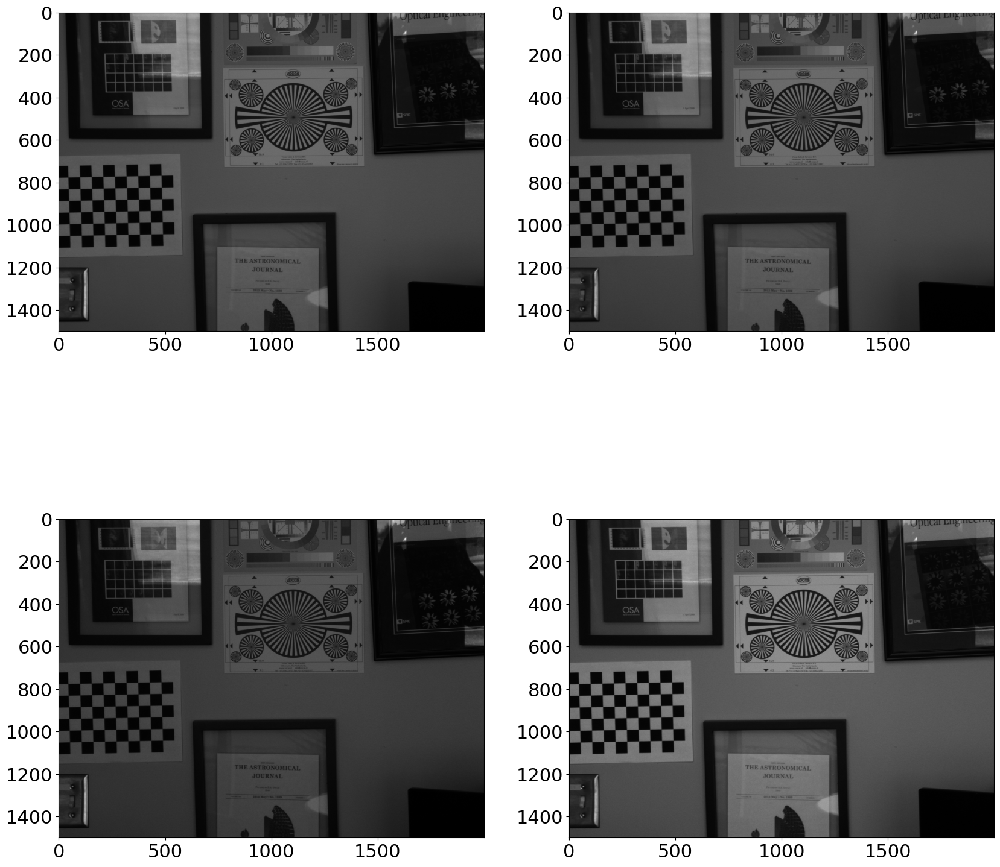

In [7]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1,cmap="gray")
plt.subplot(2,2,2)
plt.imshow(g2,cmap="gray")
plt.subplot(2,2,3)
plt.imshow(r,cmap="gray")
plt.subplot(2,2,4)
plt.imshow(b,cmap="gray")
plt.savefig('samsungTeleRGGB.pdf')
files.download('samsungTeleRGGB.pdf')

In [ ]:
g1.dtype

dtype('uint16')

In [ ]:
print(np.max(b), np.min(b))

547 1


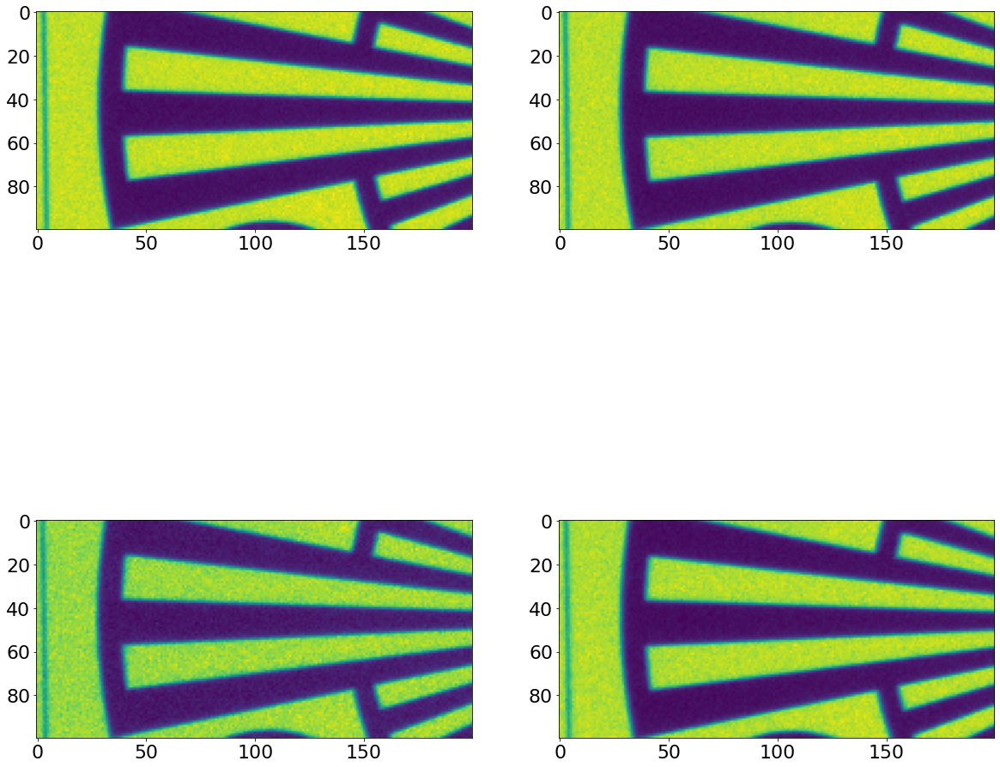

In [ ]:
plt.subplot(2,2,1)
plt.imshow(g1[450:550,800:1000])
plt.subplot(2,2,2)
plt.imshow(g2[450:550,800:1000])
plt.subplot(2,2,3)
plt.imshow(r[450:550,800:1000])
plt.subplot(2,2,4)
plt.imshow(b[450:550,800:1000])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

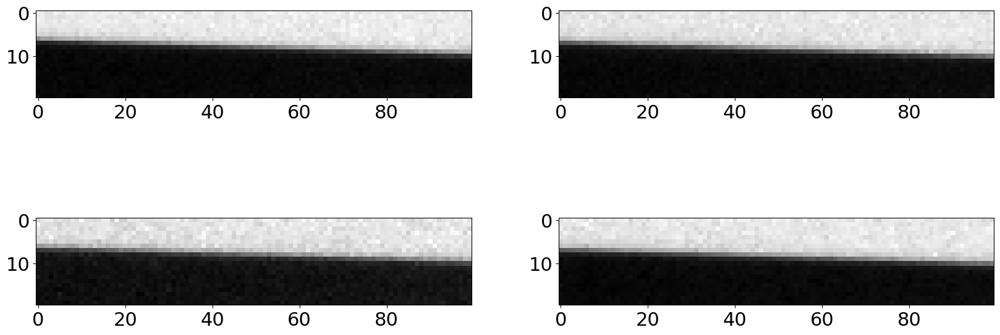

In [9]:
plt.rcParams['figure.figsize'] = [20, 8]
g1c=g1[480:500,850:950]
g2c=g2[480:500,850:950]
rc=r[480:500,850:950]
bc=b[480:500,850:950]
plt.subplot(2,2,1)
plt.imshow(g1c,cmap='gray')
plt.subplot(2,2,2)
plt.imshow(g2c,cmap='gray')
plt.subplot(2,2,3)
plt.imshow(rc,cmap='gray')
plt.subplot(2,2,4)
plt.imshow(bc, cmap='gray')
plt.savefig('samsungTeleEdge.pdf')
files.download('samsungTeleEdge.pdf')

We can find the position in the edge in each column by looking at where the gradient is across the edge is minimal. Argmin finds the position of the minimum.

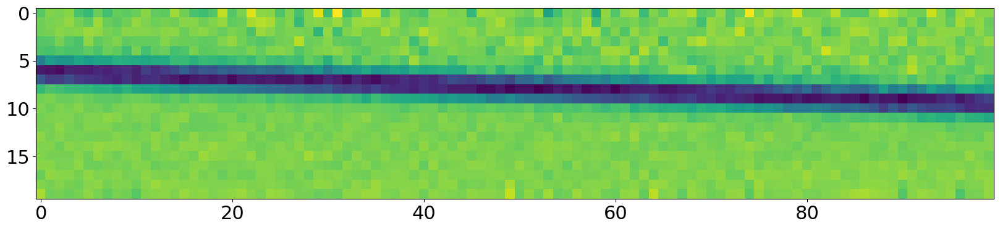

In [12]:
plt.imshow(np.gradient(g1c, axis=0))

To find the relative displacement of the edge between rows we need to find the slope of the edge, which we do here.

mean slope = 0.03398739873987399


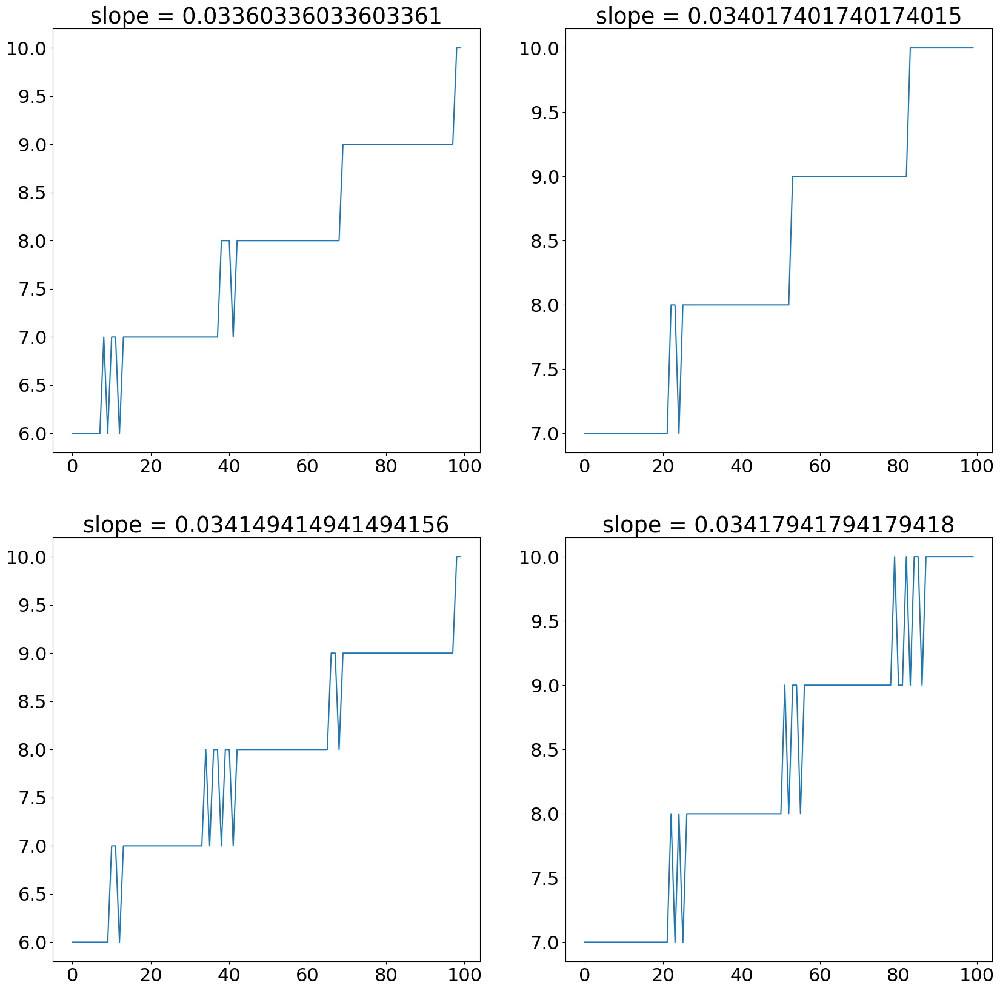

In [10]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
y=np.argmin(np.gradient(g1c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope
plt.subplot(2,2,2)
y=np.argmin(np.gradient(g2c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,3)
y=np.argmin(np.gradient(rc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,4)
y=np.argmin(np.gradient(bc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
slope=slope/4
print('mean slope =', slope)

If we plot data along a single column we only have a couple of data points within the edge region.

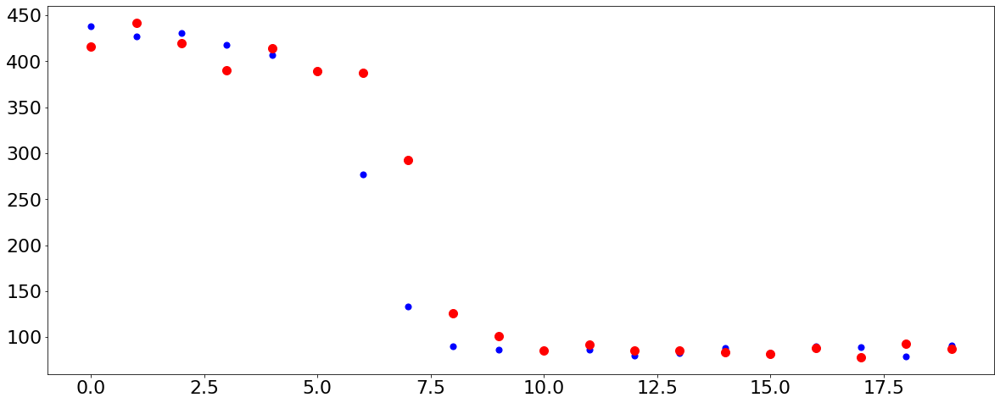

In [ ]:
plt.scatter(np.arange(20),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(20),g1c[:,29], s=100,c='red')

shifting the edge points according to the slope of the edge and combining data from multiple columns, we can densely sample the edge region. The function describing the edge is the edge shape function.

In [ ]:
points=np.zeros((np.size(g2c),2))
for pop in np.arange(g2c.shape[0]):
  for pip in np.arange(g2c.shape[1]):
    points[pop*g2c.shape[1]+pip,:]=(pop-slope*pip,g2c[pop,pip])
points=points[points[:,0].argsort(),:]


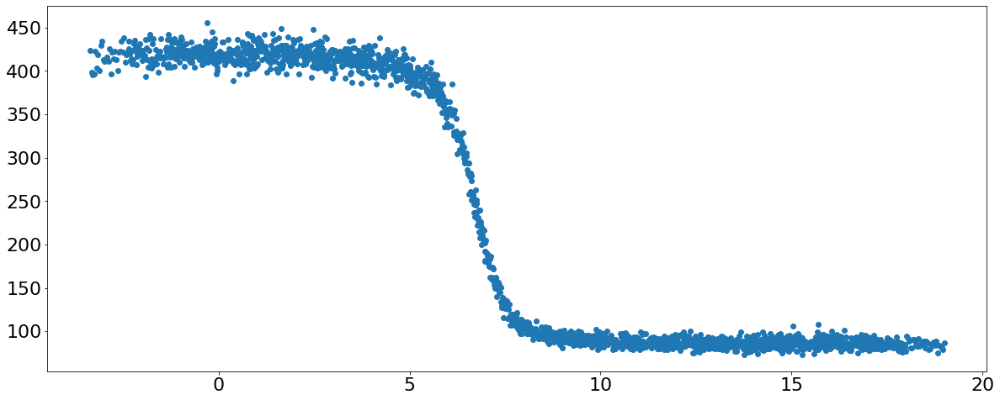

In [ ]:
plt.scatter(points[:,0],points[:,1])

We choose to model the edge as an erf function and find the best fit parameters to the erf.

In [ ]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[:,0],points[:,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

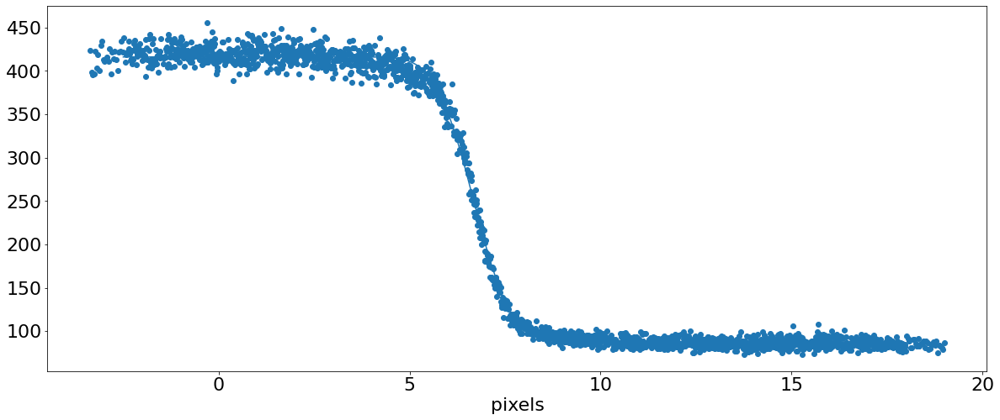

In [ ]:
xx=np.linspace(-2.5,15,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')

The ERF function has the form
$$
{\rm erf}(x)=\frac{2}{\sqrt{\pi}}\int_0^x e^{-y^2}dy
$$
such that
$$
\frac{d}{dx}{\rm erf}(x)=\frac{2}{\sqrt{\pi}}e^{-x^2}
$$

In our parameter fit of the edge, we are not concerned with the position or height, we are only concerned with the width, $\sigma$, which defines the width of the transition. Here our **line shape function**, e.g. the derivative of the edge shape function, accounting for the fact that the pixel spacing for each color channel is 2 microns, looks like this

Text(0.5, 0, 'microns')

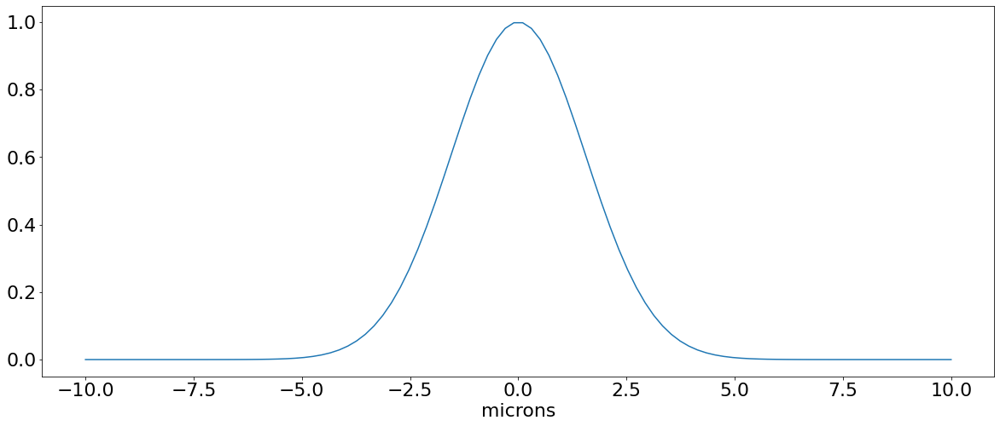

In [ ]:
x=np.linspace(-10,10,100)
plt.plot(x, np.exp(-(x/(2*params[2]))**2))
plt.xlabel('microns')

In [ ]:
params

array([-126.27321777,    5.62402979,    1.63133376,  209.13130858])

In [ ]:
var=params[2]

In [ ]:
var

1.0976193935590393

Text(0, 0.5, 'mtf')

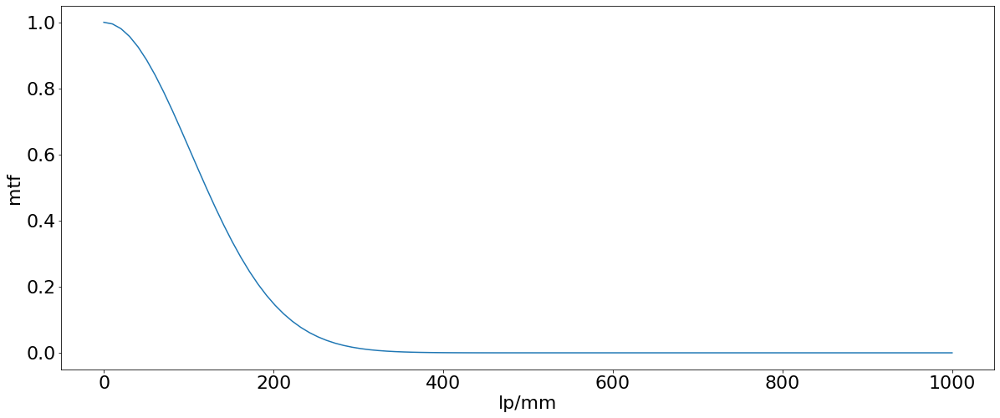

In [ ]:
plt.plot(1000*np.linspace(0,1,100), np.exp(-(np.pi**2)*(4.*var**2)*np.linspace(0,1,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')

In [ ]:
sfrData=np.array([[0,1],[50.25,0.892],[100.5,.657],[150,.425],[201,.304],[251,.253],[301,.188],[351,.067],[402,.037]])

Text(0, 0.5, 'mtf')

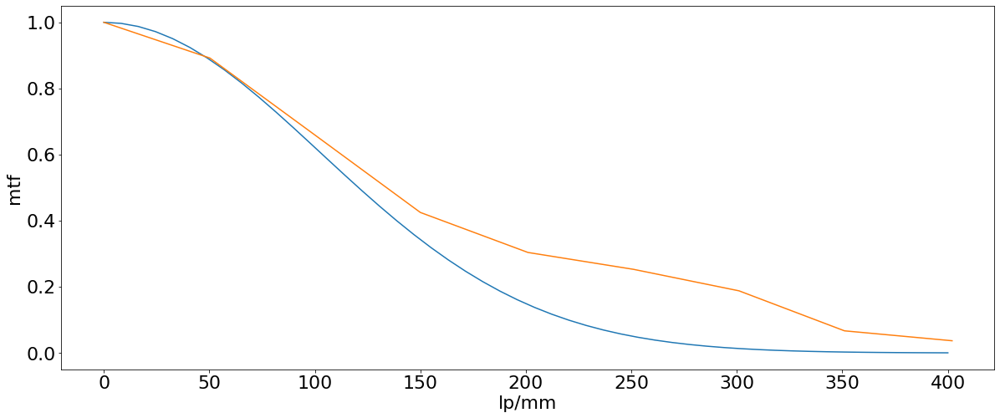

In [ ]:
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(4*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

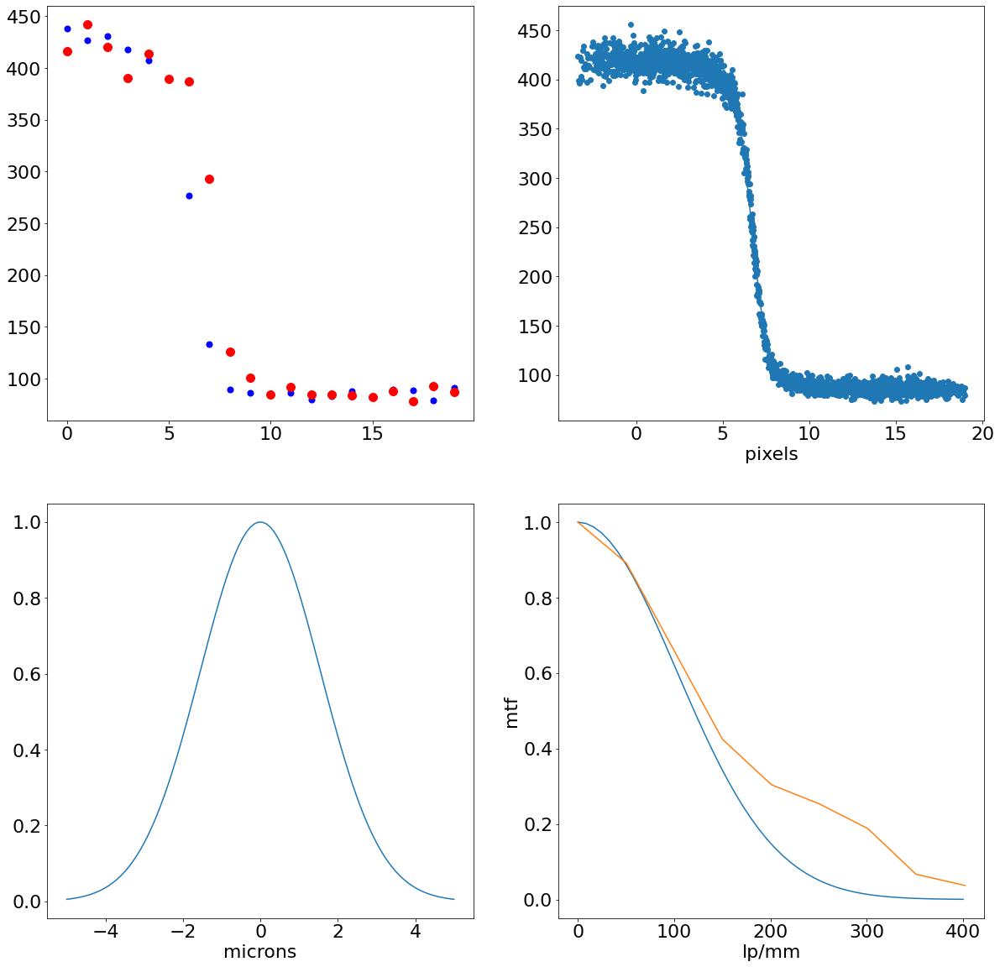

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.scatter(np.arange(20),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(20),g1c[:,29], s=100,c='red')
plt.subplot(2,2,2)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')
plt.subplot(2,2,3)
x=np.linspace(-5,5,100)
plt.plot(x, np.exp(-(x/(2*params[2]))**2))
plt.xlabel('microns')
plt.subplot(2,2,4)
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(4*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')
plt.savefig('samsungTeleMTF.pdf')
files.download('samsungTeleMTF.pdf')

## Ultrawide field lens

We consider below  a photo taken with the ultrawide lens.

samsung SM-N986U1
ƒ/2.2
1/60
2.2mm
ISO80

In [ ]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/2p2mm.dng'

--2023-01-24 20:26:33--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/2p2mm.dng
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/2p2mm.dng [following]
--2023-01-24 20:26:33--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/2p2mm.dng
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24141312 (23M) [application/octet-stream]
Saving to: ‘2p2mm.dng’

2p2mm.dng           100%[===================>]  23.02M  --.-KB/s    in 0.08s   

2023-01-2

In [ ]:
raw = rawpy.imread('2p2mm.dng')
rawImage=raw.raw_image_visible

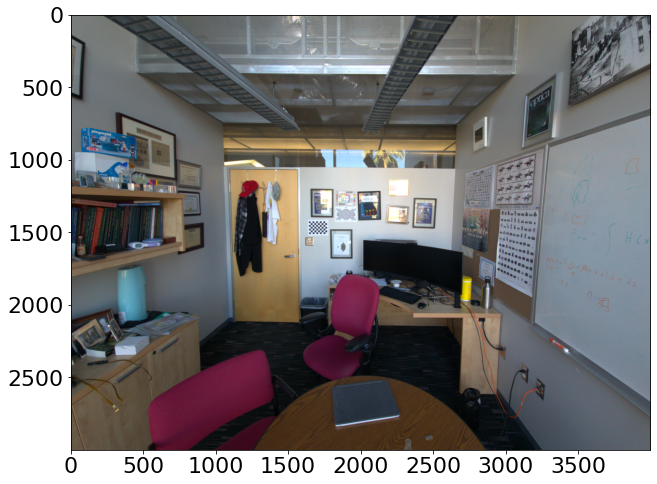

In [ ]:
plt.imshow(raw.postprocess())

In [ ]:
rawImage.shape

(3000, 4000)

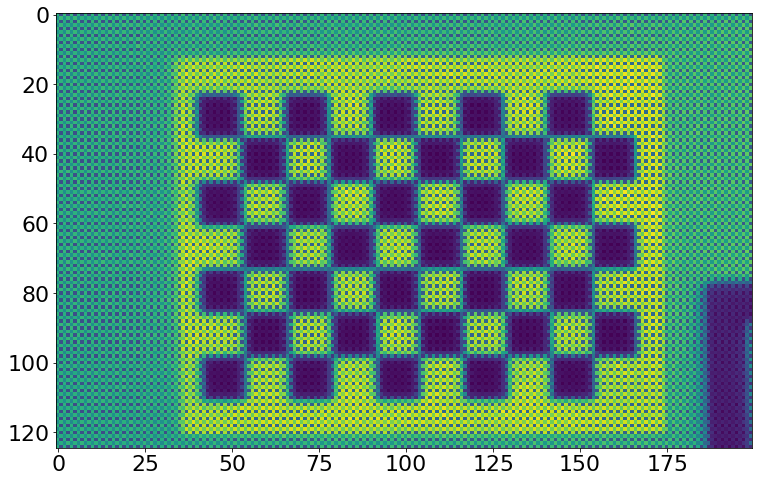

In [ ]:
plt.imshow(rawImage[1400:1525,1600:1800])

we break the image into its RGB components with the following code.

In [ ]:
g1=rawImage[0:3000:2,0:4000:2]
g2=rawImage[1:3000:2,1:4000:2]
b=rawImage[1:3000:2,0:4000:2]
r=rawImage[0:3000:2,1:4000:2]

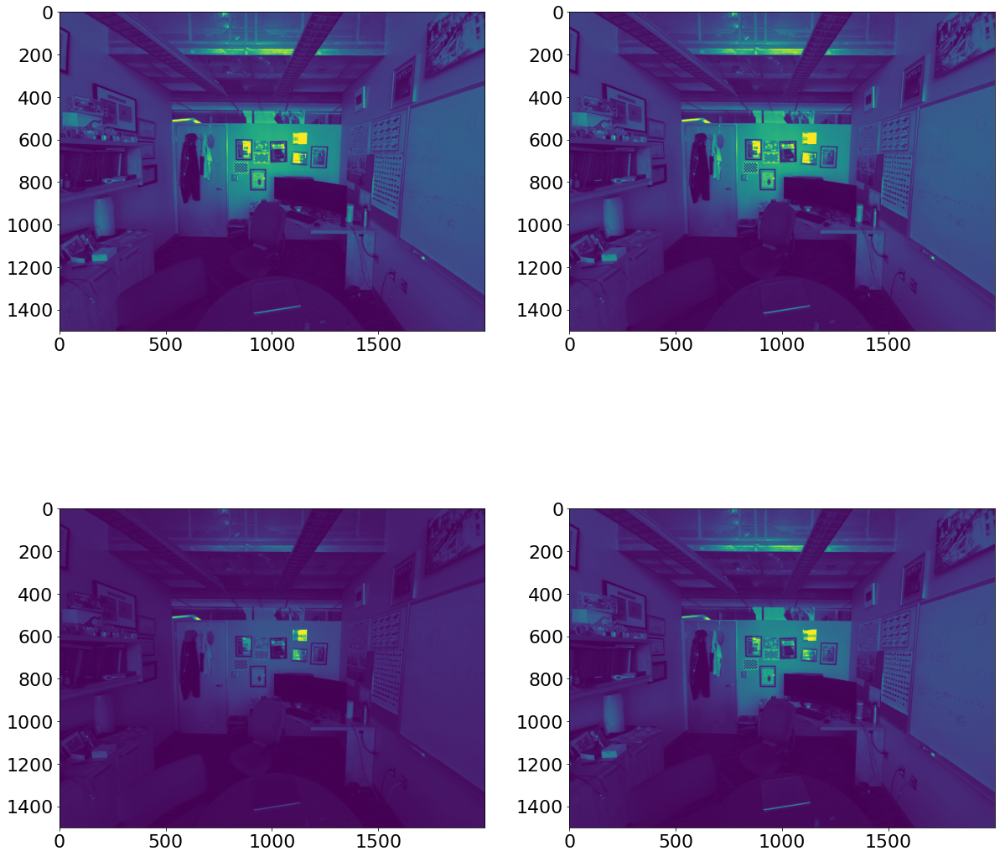

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1)
plt.subplot(2,2,2)
plt.imshow(g2)
plt.subplot(2,2,3)
plt.imshow(r)
plt.subplot(2,2,4)
plt.imshow(b)

In [ ]:
g1.dtype

dtype('uint16')

In [ ]:
print(np.max(b), np.min(b))

1023 0


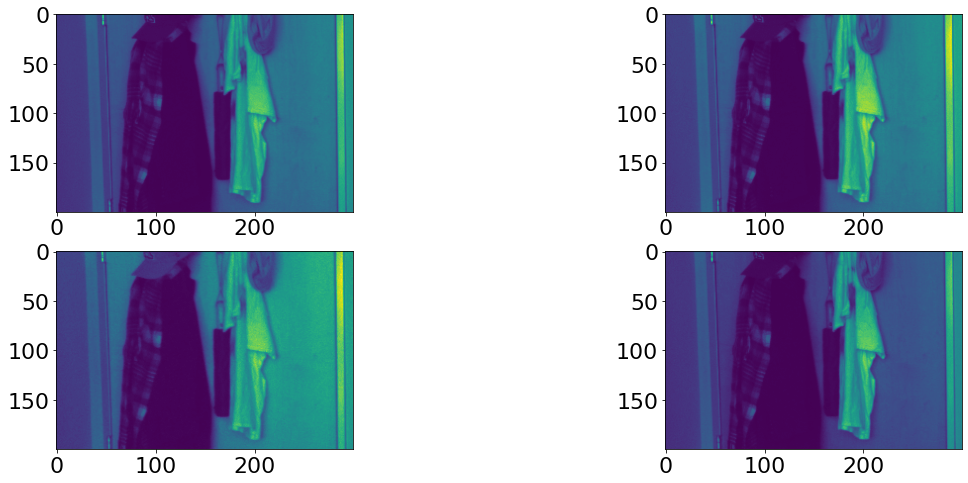

In [ ]:
plt.subplot(2,2,1)
plt.imshow(g1[600:800,500:800])
plt.subplot(2,2,2)
plt.imshow(g2[600:800,500:800])
plt.subplot(2,2,3)
plt.imshow(r[600:800,500:800])
plt.subplot(2,2,4)
plt.imshow(b[600:800,500:800])

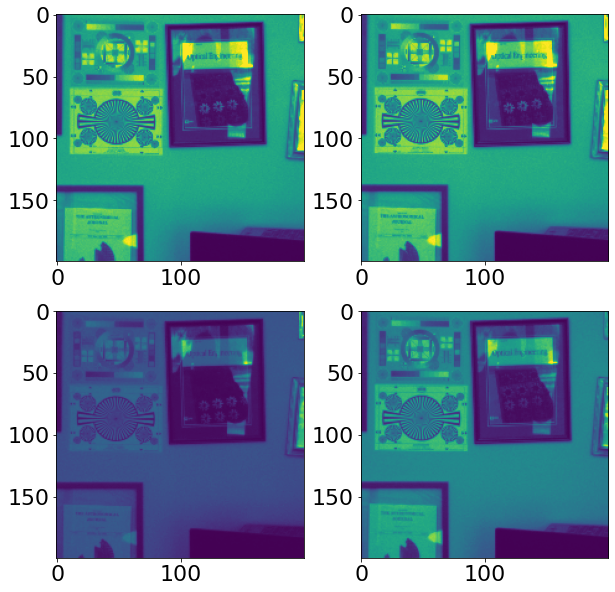

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(g1[600:800,900:1100])
plt.subplot(2,2,2)
plt.imshow(g2[600:800,900:1100])
plt.subplot(2,2,3)
plt.imshow(r[600:800,900:1100])
plt.subplot(2,2,4)
plt.imshow(b[600:800,900:1100])

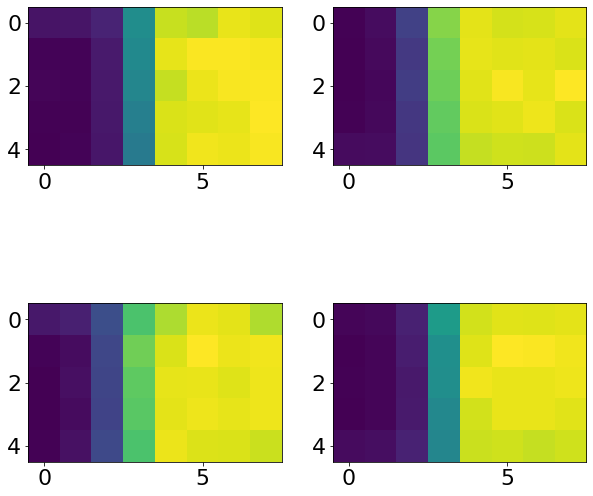

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(g1[731:736,830:838])
plt.subplot(2,2,2)
plt.imshow(g2[731:736,830:838])
plt.subplot(2,2,3)
plt.imshow(r[731:736,830:838])
plt.subplot(2,2,4)
plt.imshow(b[731:736,830:838])

note that the edge is about as sharp with the ultrawide camera as it is with the telephoto. The scale is, is of course, much less, so the angular resolution is worse by the ratio of the focal lengths. But the image blur is approximately $\lambda f/\#$, which independent of focal length.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

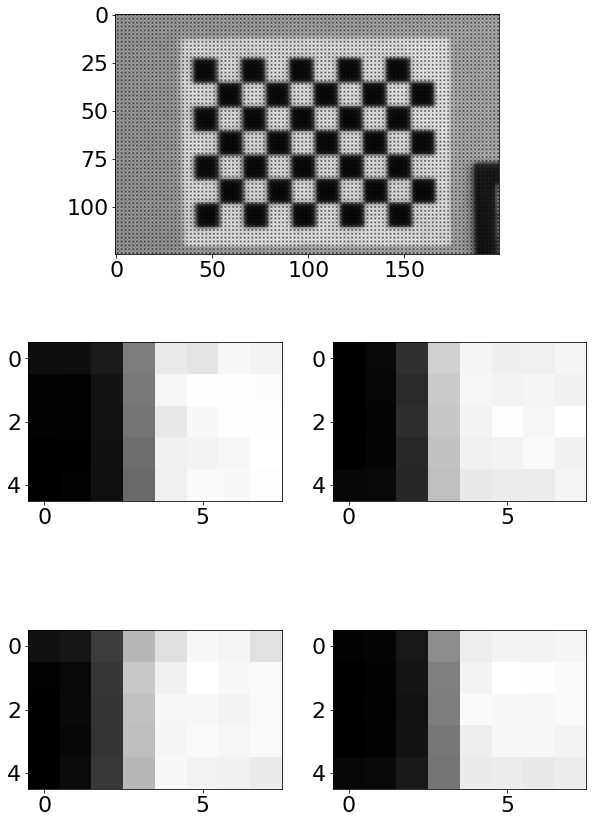

In [ ]:
plt.figure(figsize=(10,15))
plt.subplot(3,1,1)
plt.imshow(rawImage[1400:1525,1600:1800], cmap='gray')
plt.subplot(3,2,3)
plt.imshow(g1[731:736,830:838], cmap='gray')
plt.subplot(3,2,4)
plt.imshow(g2[731:736,830:838], cmap='gray')
plt.subplot(3,2,5)
plt.imshow(r[731:736,830:838], cmap='gray')
plt.subplot(3,2,6)
plt.imshow(b[731:736,830:838], cmap='gray')
plt.savefig('samsungUW.pdf')
files.download('samsungUW.pdf')

## Wide field lens

We consider below  a photo taken with the wide field lens.

samsung SM-N986U1
ƒ/1.8
1/60
7mm
ISO50

In [ ]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/7mm.dng'

--2023-01-24 20:39:55--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/7mm.dng
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/7mm.dng [following]
--2023-01-24 20:39:55--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/7mm.dng
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24141312 (23M) [application/octet-stream]
Saving to: ‘7mm.dng’

7mm.dng             100%[===================>]  23.02M  --.-KB/s    in 0.09s   

2023-01-24 20:39:

In [ ]:
raw = rawpy.imread('7mm.dng')
rawImage=raw.raw_image_visible

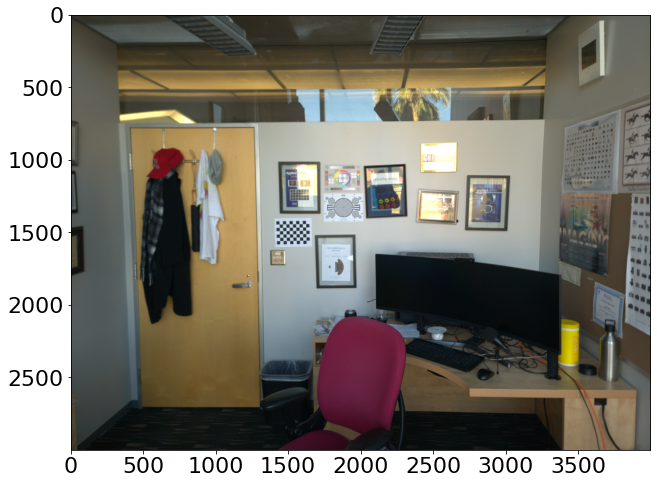

In [ ]:
plt.imshow(raw.postprocess())

In [ ]:
rawImage.shape

(3000, 4000)

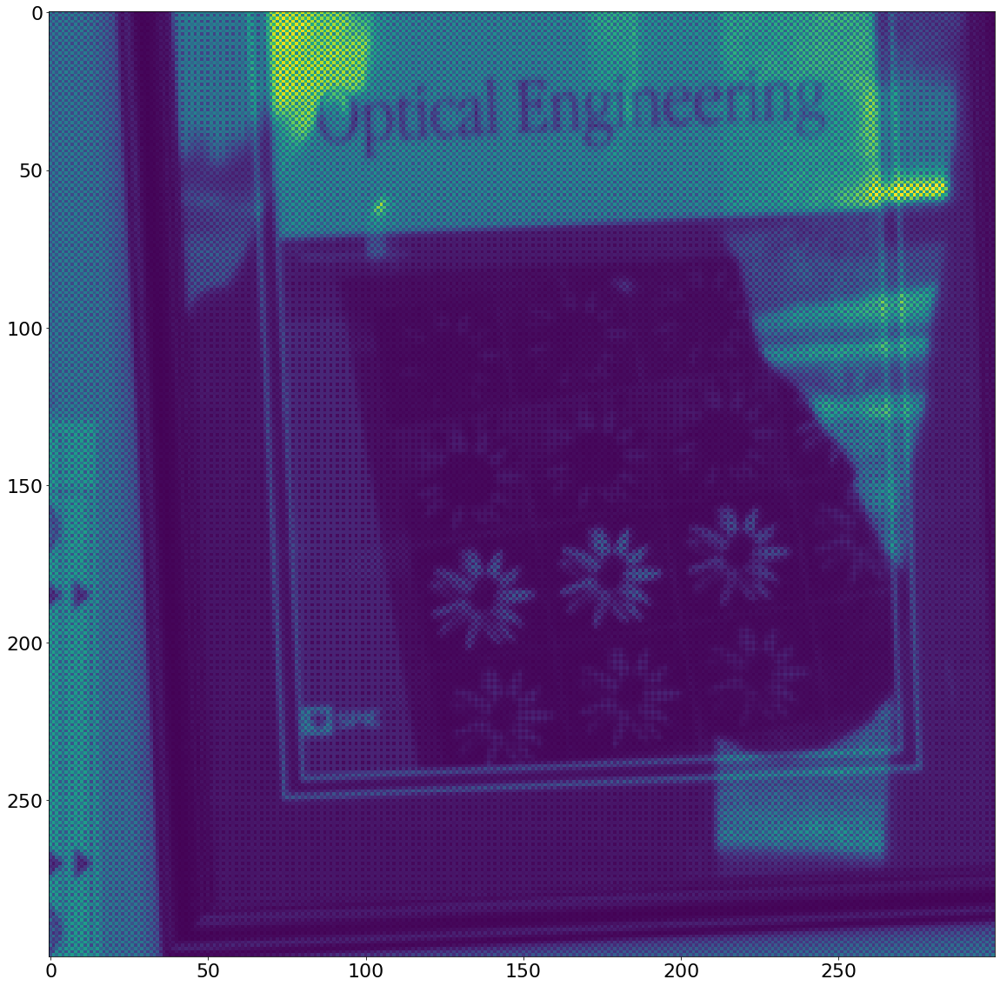

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(rawImage[1100:1400,2000:2300])

we break the image into its RGB components with the following code.

In [ ]:
g1=rawImage[0:3000:2,0:4000:2]
g2=rawImage[1:3000:2,1:4000:2]
b=rawImage[1:3000:2,0:4000:2]
r=rawImage[0:3000:2,1:4000:2]

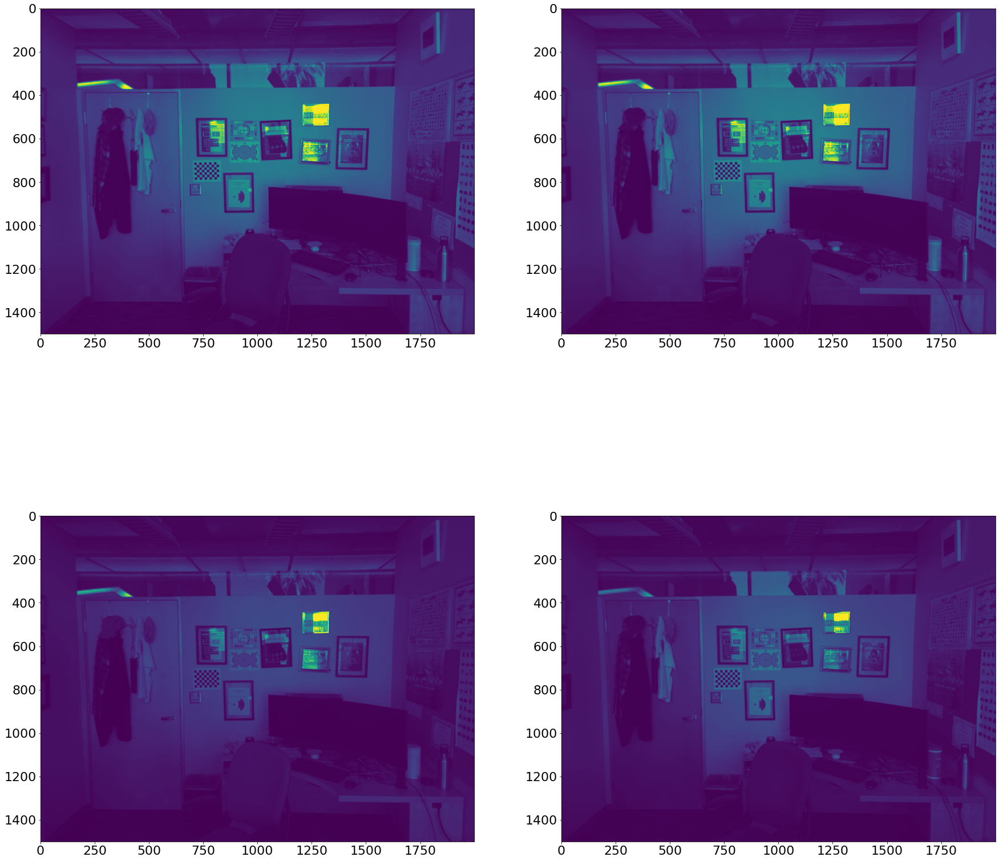

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(2,2,1)
plt.imshow(g1)
plt.subplot(2,2,2)
plt.imshow(g2)
plt.subplot(2,2,3)
plt.imshow(r)
plt.subplot(2,2,4)
plt.imshow(b)

In [ ]:
g1.dtype

dtype('uint16')

In [ ]:
print(np.max(b), np.min(b))

1023 1


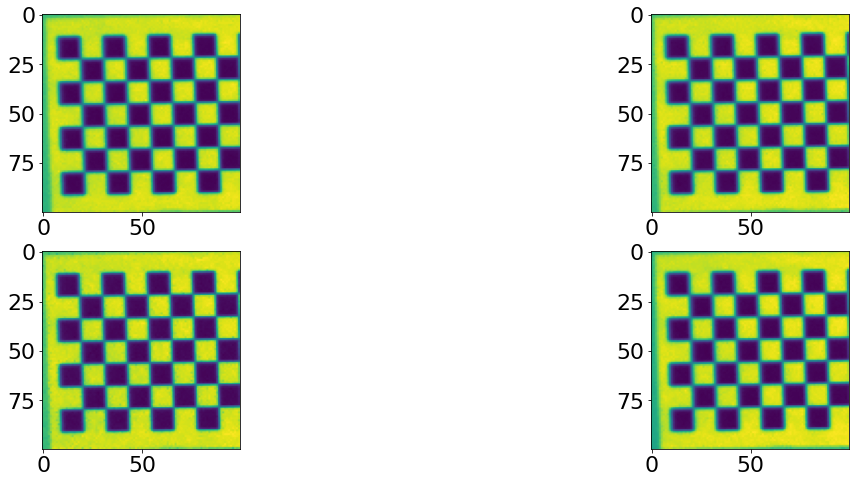

In [ ]:
plt.subplot(2,2,1)
plt.imshow(g1[700:800,700:800])
plt.subplot(2,2,2)
plt.imshow(g2[700:800,700:800])
plt.subplot(2,2,3)
plt.imshow(r[700:800,700:800])
plt.subplot(2,2,4)
plt.imshow(b[700:800,700:800])

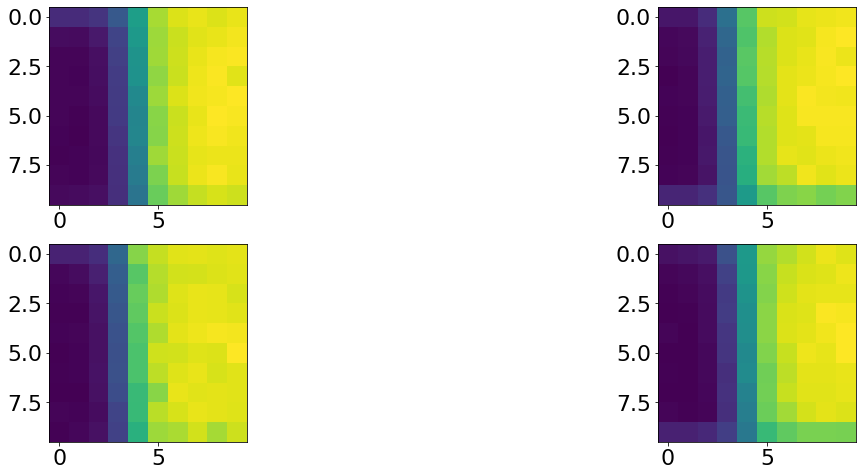

In [ ]:
plt.rcParams['figure.figsize'] = [20, 8]
g1c=g1[712:722,715:725]
g2c=g2[712:722,715:725]
rc=r[712:722,715:725]
bc=b[712:722,715:725]
plt.subplot(2,2,1)
plt.imshow(g1c)
plt.subplot(2,2,2)
plt.imshow(g2c)
plt.subplot(2,2,3)
plt.imshow(rc)
plt.subplot(2,2,4)
plt.imshow(bc)

there is not enough tilt in the edges to do super resolution.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

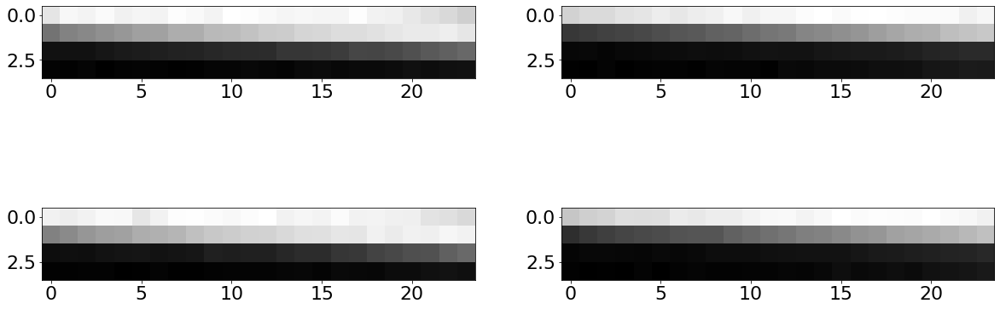

In [ ]:
plt.subplot(2,2,1)
plt.imshow(g1[661:665,886:910],cmap='gray')
plt.subplot(2,2,2)
plt.imshow(g2[661:665,886:910],cmap='gray')
plt.subplot(2,2,3)
plt.imshow(r[661:665,886:910],cmap='gray')
plt.subplot(2,2,4)
plt.imshow(b[661:665,886:910],cmap='gray')
plt.savefig('samsungW.pdf')
files.download('samsungW.pdf')

To find the relative displacement of the edge between rows we need to find the slope of the edge, which we do here.

mean slope = 0.06445652173913044


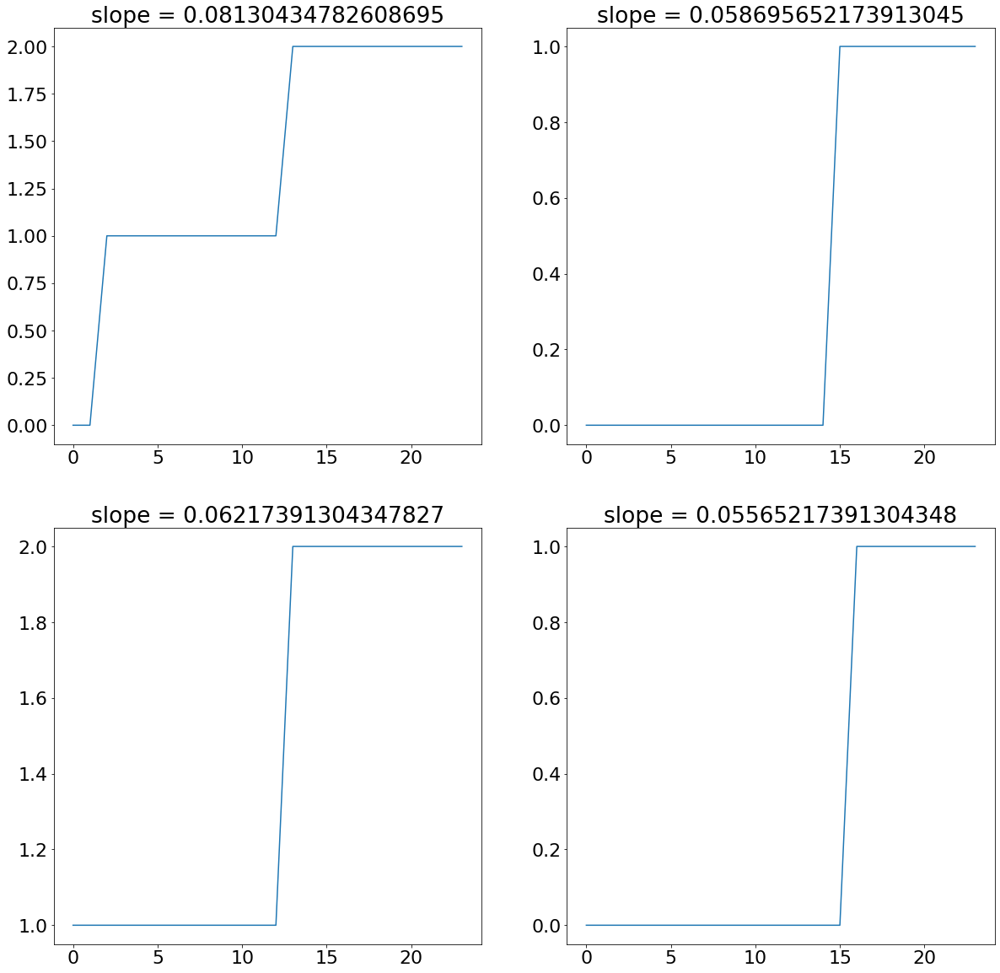

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
y=np.argmin(np.gradient(g1[661:665,886:910], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope
plt.subplot(2,2,2)
y=np.argmin(np.gradient(g2[661:665,886:910], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,3)
y=np.argmin(np.gradient(r[661:665,886:910], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,4)
y=np.argmin(np.gradient(b[661:665,886:910], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
slope=slope/4
print('mean slope =', slope)

In [ ]:
1/slope

15.514333895446878

shifting the edge points according to the slope of the edge and combining data from multiple columns, we can densely sample the edge region. The function describing the edge is the edge shape function.

In [ ]:
g1c=g1[661:665,886:910]
points=np.zeros((np.size(g1c),2))
for pop in np.arange(g1c.shape[0]):
  for pip in np.arange(g1c.shape[1]):
    points[pop*g1c.shape[1]+pip,:]=(pop-slope*pip,g1c[pop,pip])
points=points[points[:,0].argsort(),:]


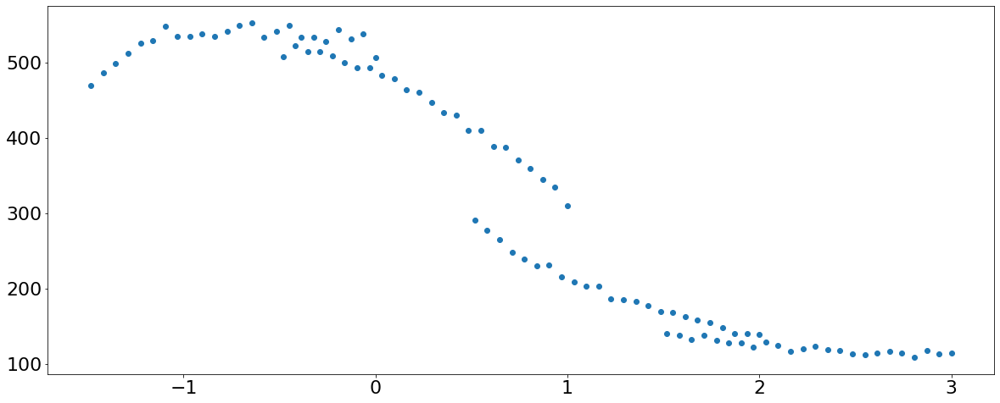

In [ ]:
plt.scatter(points[:,0],points[:,1])

apparently we do not have enough accuracy on this short edge to estimate the slope accurately, thus the separation in the dot curves.

In [ ]:
points=np.zeros((np.size(g1c),2))
for pop in np.arange(g1c.shape[0]):
  for pip in np.arange(g1c.shape[1]):
    points[pop*g1c.shape[1]+pip,:]=(pop-.65*slope*pip,g1c[pop,pip])
points=points[points[:,0].argsort(),:]


adjusting the estimated slope brings the multi row dot curves together.


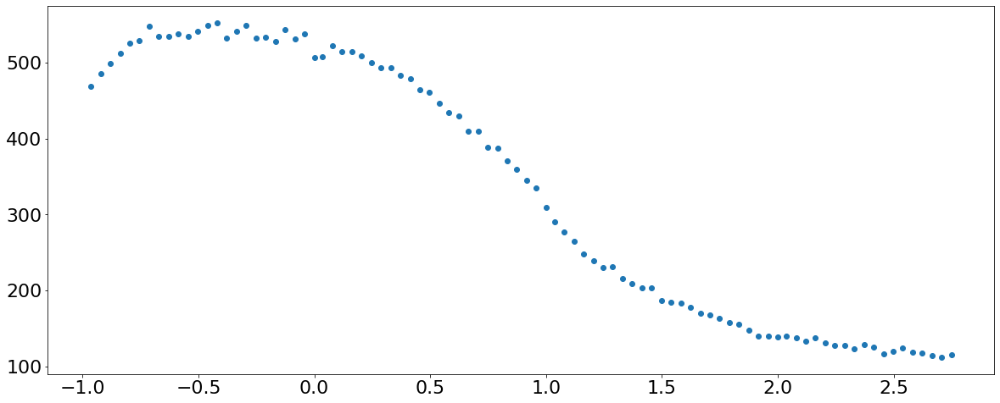

In [ ]:
plt.scatter(points[:90,0],points[:90,1])

In [ ]:
points.shape

(96, 2)

We choose to model the edge as an erf function and find the best fit parameters to the erf.

In [ ]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[15:,0],points[15:,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

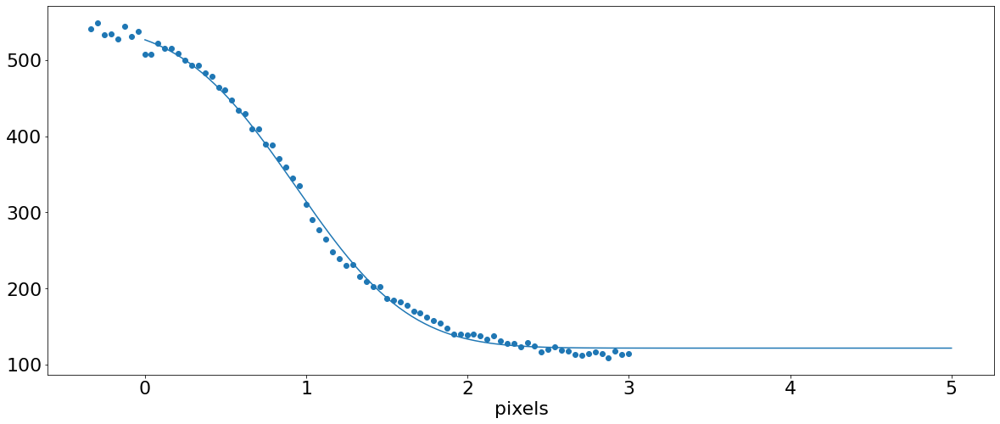

In [ ]:
xx=np.linspace(-0,5,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[15:,0],points[15:,1])
plt.xlabel('pixels')

The ERF function has the form
$$
{\rm erf}(x)=\frac{2}{\sqrt{\pi}}\int_0^x e^{-y^2}dy
$$
such that
$$
\frac{d}{dx}{\rm erf}(x)=\frac{2}{\sqrt{\pi}}e^{-x^2}
$$

In our parameter fit of the edge, we are not concerned with the position or height, we are only concerned with the width, $\sigma$, which defines the width of the transition. Here our **line shape function**, e.g. the derivative of the edge shape function, accounting for the fact that the pixel spacing for each color channel is 1.6 microns (the sensor pixels are .8 microns) , looks like this

Text(0.5, 0, 'microns')

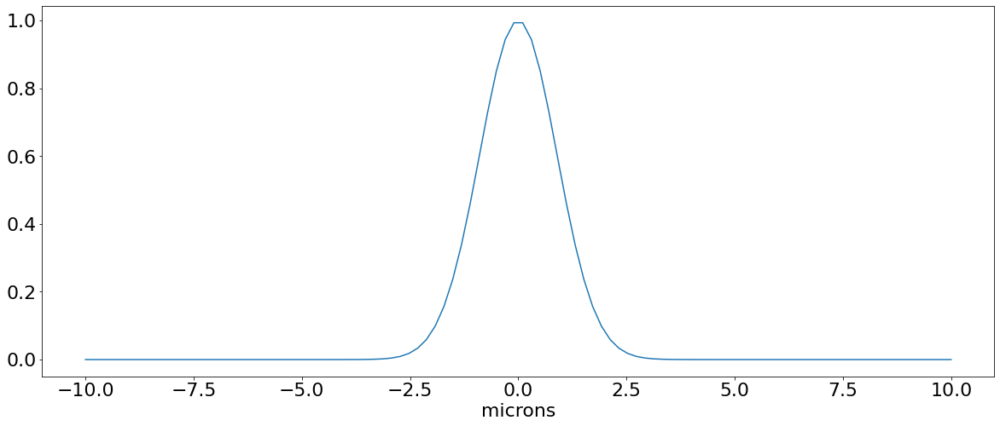

In [ ]:
x=np.linspace(-10,10,100)
plt.plot(x, np.exp(-(x/(1.6*params[2]))**2))
plt.xlabel('microns')

In [ ]:
params

array([-212.29466479,    0.93413929,    0.78861149,  334.11333862])

In [ ]:
var=params[2]

In [ ]:
var

0.7886114904870021

Text(0, 0.5, 'mtf')

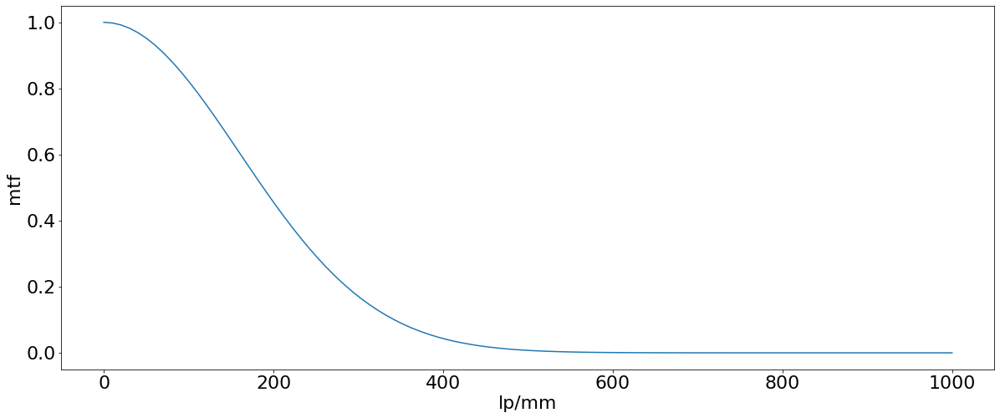

In [ ]:
plt.plot(1000*np.linspace(0,1,100), np.exp(-(np.pi**2)*(3.2*var**2)*np.linspace(0,1,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')

the wide field lens has better MTF than the telephoto, which is not surpising since the telephoto periscope likely leads to aberrations.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

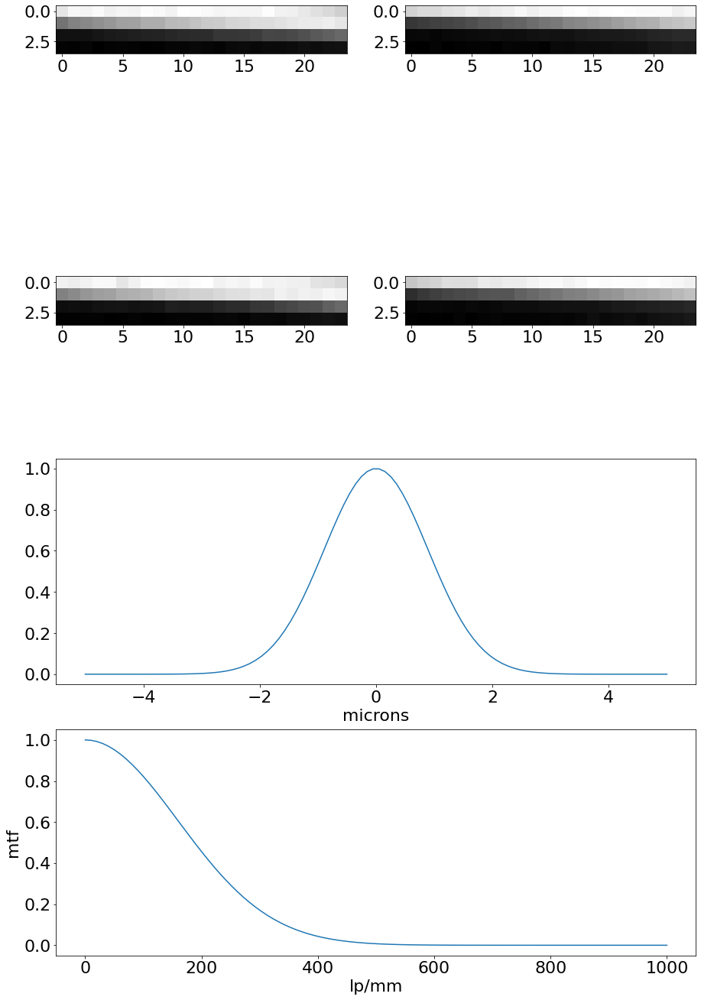

In [ ]:
plt.figure(figsize=(15,25))
plt.subplot(4,2,1)
plt.imshow(g1[661:665,886:910],cmap='gray')
plt.subplot(4,2,2)
plt.imshow(g2[661:665,886:910],cmap='gray')
plt.subplot(4,2,3)
plt.imshow(r[661:665,886:910],cmap='gray')
plt.subplot(4,2,4)
plt.imshow(b[661:665,886:910],cmap='gray')
plt.subplot(4,1,3)
x=np.linspace(-5,5,100)
plt.plot(x, np.exp(-(x/(1.6*params[2]))**2))
plt.xlabel('microns')
plt.subplot(4,1,4)
plt.plot(1000*np.linspace(0,1,100), np.exp(-(np.pi**2)*(3.2*var**2)*np.linspace(0,1,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')
plt.savefig('samsungW.pdf')
files.download('samsungW.pdf')

## Analysis of Samsung S23 Ultra and Samsung S6 Lite tablet cameras

In [21]:
!wget --no-check-certificate --content-disposition https://arizona.box.com/shared/static/q5wktflhuruo7e309tn4ynhuf3na6btj
!wget --no-check-certificate --content-disposition https://arizona.box.com/shared/static/ude9es5xkps8xhjzuznytgzxpde20vuy

--2025-03-23 19:29:43--  https://arizona.box.com/shared/static/q5wktflhuruo7e309tn4ynhuf3na6btj
Resolving arizona.box.com (arizona.box.com)... 74.112.186.157, 2620:117:bff0:12d::
Connecting to arizona.box.com (arizona.box.com)|74.112.186.157|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /public/static/q5wktflhuruo7e309tn4ynhuf3na6btj [following]
--2025-03-23 19:29:43--  https://arizona.box.com/public/static/q5wktflhuruo7e309tn4ynhuf3na6btj
Reusing existing connection to arizona.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://arizona.app.box.com/public/static/q5wktflhuruo7e309tn4ynhuf3na6btj [following]
--2025-03-23 19:29:43--  https://arizona.app.box.com/public/static/q5wktflhuruo7e309tn4ynhuf3na6btj
Resolving arizona.app.box.com (arizona.app.box.com)... 74.112.186.157, 2620:117:bff0:12d::
Connecting to arizona.app.box.com (arizona.app.box.com)|74.112.186.157|:443... connected.
HTTP request sent, 

In [35]:
rawS23 = rawpy.imread('galaxyS23Ultra.dng')
rawImageS23=rawS23.raw_image_visible
rawImageS23=rawImageS23-np.min(rawImageS23)
rawImageS23=rawImageS23/np.max(rawImageS23)
rawImageS23=rawImageS23*255
rawImageS23=rawImageS23.astype('uint8')

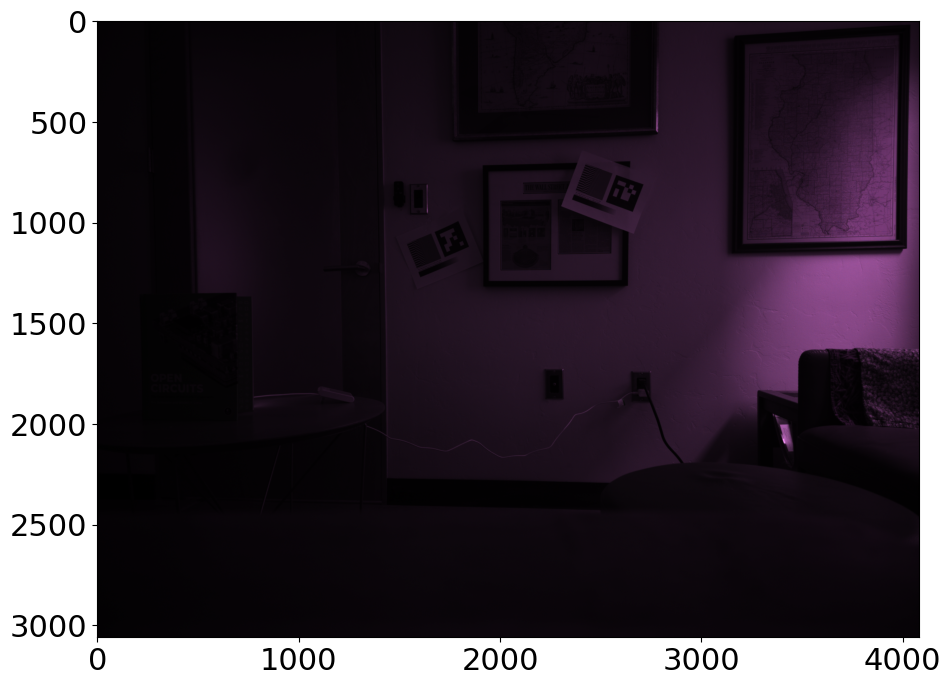

In [36]:
# prompt: convert rawImageS23 from bayer data to rgb using opencv and display the rgb image

rgb_image = cv2.cvtColor(rawImageS23, cv2.COLOR_BayerRG2RGB)

# Display the RGB image
plt.imshow(rgb_image)
plt.show()


In [ ]:
S23=ra